# Breed detection

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Main-concept" data-toc-modified-id="Main-concept-1">Main concept</a></span></li><li><span><a href="#Load-images" data-toc-modified-id="Load-images-2">Load images</a></span></li><li><span><a href="#Model-training" data-toc-modified-id="Model-training-3">Model training</a></span></li><li><span><a href="#Prediction" data-toc-modified-id="Prediction-4">Prediction</a></span></li><li><span><a href="#Examples-of-detected-breeds" data-toc-modified-id="Examples-of-detected-breeds-5">Examples of detected breeds</a></span></li><li><span><a href="#Save-trained-models" data-toc-modified-id="Save-trained-models-6">Save trained models</a></span></li></ul></div>

Dataset https://www.kaggle.com/c/dog-breed-identification/data

Code base https://www.kaggle.com/midouazerty/dog-breed-identification-using-keras-92-accuracy 


## Main concept

* The main concept used here is to extract features from the images using pretrained Models and train on them. 
* To increase the generalization we can extract features using many different models, concatenate them and use them together. 

In [1]:
# for garbage collection
import gc

# for warnings
import warnings
warnings.filterwarnings("ignore")

# utility libraries
import os
import copy
import tqdm
import numpy as np 
import pandas as pd 
import cv2, random, time, shutil, csv
import tensorflow as tf
import math

# keras libraries
import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Model
from keras.layers import BatchNormalization, Dense, GlobalAveragePooling2D, Lambda, Dropout, InputLayer, Input
from keras.utils import to_categorical
from keras import backend as K

## Load images

In [2]:
# set image size here
img_size = 331
data_dir = 'dog-breed-identification'
data_df = pd.read_csv(os.path.join(data_dir, 'labels.csv'))
class_names = sorted(data_df['breed'].unique())
print(f"No. of classes read - {len(class_names)}")
time.sleep(1)

images_list = sorted(os.listdir(os.path.join(data_dir, 'train')))
X = []
Y = []
i = 0
for image in tqdm.tqdm(images_list):
    cls_name = data_df[data_df['id'] == image[:-4]].iloc[0,1]
    cls_index = int(class_names.index(cls_name)) 

    # Reading RGB Images
    image_path = os.path.join(data_dir, 'train',image)
    orig_image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    res_image = cv2.resize(orig_image,(img_size, img_size))
    X.append(res_image)
    Y.append(cls_index)
    i+=1

No. of classes read - 120


100%|███████████████████████████████████████████████████████████████████████████| 10222/10222 [01:28<00:00, 114.90it/s]


Converting the lists to arrays and deleting the list for memory saving

In [3]:
# Converting to arrays
print(len(X), len(Y))
Xarr = np.array(X)
Yarr = np.array(Y).reshape(-1,1)

del(X)
print(Xarr.shape, Yarr.shape)
gc.collect()

10222 10222
(10222, 331, 331, 3) (10222, 1)


42

One Hot encoding the classes

In [4]:
# converting labels to one hot
Yarr_hot = to_categorical(Y)
print(Xarr.shape, Yarr_hot.shape)

(10222, 331, 331, 3) (10222, 120)


Here we will prepare the training feature extraction pipeline.
* I have made separate functions for feature extraction for training and validation to experiment with augmentations for training.
* For now I have included random flip and brightness augmentations, feel free to add further.

In [5]:
# FEATURE EXTRACTION OF TRAINING ARRAYS
AUTO = tf.data.experimental.AUTOTUNE
def get_features(model_name, data_preprocessor, data):
    '''
    1- Create a feature extractor to extract features from the data.
    2- Returns the extracted features and the feature extractor.

    '''
    dataset = tf.data.Dataset.from_tensor_slices(data)


    def preprocess(x):
        x = tf.image.random_flip_left_right(x)
        x = tf.image.random_brightness(x, 0.5)
        return x

    ds = dataset.map(preprocess, num_parallel_calls=AUTO).batch(64)

    input_size = data.shape[1:]
    #Prepare pipeline.
    input_layer = Input(input_size)
    preprocessor = Lambda(data_preprocessor)(input_layer)

    base_model = model_name(weights='imagenet', include_top=False,
                                input_shape=input_size)(preprocessor)

    avg = GlobalAveragePooling2D()(base_model)
    feature_extractor = Model(inputs = input_layer, outputs = avg)


    #Extract feature.
    feature_maps = feature_extractor.predict(ds, verbose=1)
    print('Feature maps shape: ', feature_maps.shape)
    
    # deleting variables
    del(feature_extractor, base_model, preprocessor, dataset)
    gc.collect()
    return feature_maps

In [6]:
# FEATURE EXTRACTION OF VALIDAION AND TESTING ARRAYS
def get_valfeatures(model_name, data_preprocessor, data):
    '''
    Same as above except not image augmentations applied.
    Used for feature extraction of validation and testing.
    '''

    dataset = tf.data.Dataset.from_tensor_slices(data)

    ds = dataset.batch(64)

    input_size = data.shape[1:]
    #Prepare pipeline.
    input_layer = Input(input_size)
    preprocessor = Lambda(data_preprocessor)(input_layer)

    base_model = model_name(weights='imagenet', include_top=False,
                                input_shape=input_size)(preprocessor)

    avg = GlobalAveragePooling2D()(base_model)
    feature_extractor = Model(inputs = input_layer, outputs = avg)
    #Extract feature.
    feature_maps = feature_extractor.predict(ds, verbose=1)
    print('Feature maps shape: ', feature_maps.shape)
    return feature_maps

As explained previously, we will use several Pretrained models to extract features and concatenate them to make the final feature vector. 
* This function takes the models, preprocessors and the training/validation tag and calls the above functions.
* We can even add custom features here like, mean, variance and other statistical measures.
* This helps keep the pipeline neat

In [7]:
# RETURNING CONCATENATED FEATURES USING MODELS AND PREPROCESSORS
def get_concat_features(feat_func, models, preprocs, array):

    print(f"Beggining extraction with {feat_func.__name__}\n")
    feats_list = []

    for i in range(len(models)):
        
        print(f"\nStarting feature extraction with {models[i].__name__} using {preprocs[i].__name__}\n")
        # applying the above function and storing in list
        feats_list.append(feat_func(models[i], preprocs[i], array))

    # features concatenating
    final_feats = np.concatenate(feats_list, axis=-1)
    # memory saving
    del(feats_list, array)
    gc.collect()

    return final_feats


* We are using 4 models here, InceptionV3, Xception, NASNetLarge and InceptionResnetV2. We are importing their model architecture and their preprocessors.
* Feel free to test with other models

In [8]:
# DEFINING models and preprocessors imports 

from keras.applications.inception_v3 import InceptionV3, preprocess_input
inception_preprocessor = preprocess_input

from keras.applications.xception import Xception, preprocess_input
xception_preprocessor = preprocess_input

from keras.applications.nasnet import NASNetLarge, preprocess_input
nasnet_preprocessor = preprocess_input

from keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input
inc_resnet_preprocessor = preprocess_input

models = [InceptionV3,  InceptionResNetV2, Xception, ]
preprocs = [inception_preprocessor,  inc_resnet_preprocessor, 
            xception_preprocessor, ]

Finally the feature extraction part

In [9]:
# calculating features of the data

final_train_features = get_concat_features(get_features, models, preprocs, Xarr)

#del(x_train, )
gc.collect()
print('Final feature maps shape', final_train_features.shape)

Beggining extraction with get_features


Starting feature extraction with InceptionV3 using preprocess_input

160/160 [==============================] - 1170s 7s/step
Feature maps shape:  (10222, 2048)

Starting feature extraction with InceptionResNetV2 using preprocess_input

160/160 [==============================] - 2388s 15s/step
Feature maps shape:  (10222, 1536)

Starting feature extraction with Xception using preprocess_input

160/160 [==============================] - 1682s 10s/step
Feature maps shape:  (10222, 2048)
Final feature maps shape (10222, 5632)


## Model training
* We are using a STRATIFIED 3 FOLD Split to train a small Deep Neural network.
* The DNN consists of the Input Layer, a Dropout for regularization and the Output Dense layer.
* The models are trained for 80 epochs with Early stopping callback and adam optimizer.
* The Models are stored in a list for prediction

In [10]:
from keras.callbacks import EarlyStopping
EarlyStop_callback = keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True,
                                                   verbose=0)

my_callback=[EarlyStop_callback]

In [11]:
from sklearn.model_selection import StratifiedKFold

splits = list(StratifiedKFold(n_splits=3, shuffle=True, random_state=10).split(final_train_features, Y))

trained_models = []
accuracy = []
losses = []

#Prepare And Train DNN model

for i, (train_idx, valid_idx) in enumerate(splits): 

    print(f"\nStarting fold {i+1}\n")
    x_train_fold = final_train_features[train_idx, :]
    y_train_fold = Yarr_hot[train_idx, :]
    x_val_fold = final_train_features[valid_idx]
    y_val_fold = Yarr_hot[valid_idx, :]

    dnn = keras.models.Sequential([
        InputLayer(final_train_features.shape[1:]),
        Dropout(0.7),
        Dense(120, activation='softmax')
    ])

    dnn.compile(optimizer='adam',
                loss='categorical_crossentropy',
                metrics=['accuracy'])

    print("Training...")
    #Train simple DNN on extracted features.
    h = dnn.fit(x_train_fold, y_train_fold,
                batch_size=128,
                epochs=80,
                verbose=0,
                validation_data = (x_val_fold, y_val_fold),
                callbacks=my_callback)  # max 95.07

    print("Evaluating model ...")
    model_res = dnn.evaluate(x_val_fold, y_val_fold)

    accuracy.append(model_res[1])
    losses.append(model_res[0])
    trained_models.append(dnn)

print('\n CV Score -')
print(f"\nAccuracy - {sum(accuracy)/len(accuracy)}")
print(f"\nLoss - {sum(losses)/len(losses)}")


Starting fold 1

Training...
Evaluating model ...
107/107 [==============================] - 0s 2ms/step - loss: 0.2412 - accuracy: 0.9234

Starting fold 2

Training...
Evaluating model ...
107/107 [==============================] - 0s 2ms/step - loss: 0.2769 - accuracy: 0.9196

Starting fold 3

Training...
Evaluating model ...
107/107 [==============================] - 0s 2ms/step - loss: 0.2478 - accuracy: 0.9252

 CV Score -

Accuracy - 0.9227156440416971

Loss - 0.25529880821704865


In [12]:
# SAVING RAM

del(final_train_features, Y, Yarr_hot, Xarr)
gc.collect()

4893

## Prediction


In [13]:
# TEST IMAGES
test_images_list = sorted(os.listdir(os.path.join(data_dir, 'test')))
X = []
i = 0
for image in tqdm.tqdm(test_images_list):

    image_path = os.path.join(data_dir, 'test',image)
    orig_image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    res_image = cv2.resize(orig_image,(img_size, img_size))
    X.append(res_image)
    i+=1

Xtesarr = np.array(X)

del(X)
gc.collect()

# FEATURE EXTRACTION OF TEST IMAGES
test_features = get_concat_features(get_valfeatures, models, preprocs, Xtesarr)

del(Xtesarr)
gc.collect()
print('Final feature maps shape', test_features.shape)

y_pred_norm = trained_models[0].predict(test_features, batch_size=128)/3
for dnn in trained_models[1:]:
    y_pred_norm += dnn.predict(test_features, batch_size=128)/3

100%|███████████████████████████████████████████████████████████████████████████| 10357/10357 [00:44<00:00, 230.30it/s]


Beggining extraction with get_valfeatures


Starting feature extraction with InceptionV3 using preprocess_input

162/162 [==============================] - 983s 6s/step
Feature maps shape:  (10357, 2048)

Starting feature extraction with InceptionResNetV2 using preprocess_input

162/162 [==============================] - 2351s 14s/step
Feature maps shape:  (10357, 1536)

Starting feature extraction with Xception using preprocess_input

162/162 [==============================] - 1699s 10s/step
Feature maps shape:  (10357, 2048)
Final feature maps shape (10357, 5632)


In [14]:
# TEST IMAGES
import os

data_dir = 'C:/Users/vbogina/Desktop/MO united/Dogs_breeds/dog-breed-identification/dataset_tail_/'

test_images_list_long = sorted(os.listdir(os.path.join(data_dir, 'long')))
test_images_list_short = sorted(os.listdir(os.path.join(data_dir, 'short')))
test_images_list = test_images_list_long + test_images_list_short
                               
tail_list = ['long']*len(test_images_list_long) + ['short']*len(test_images_list_short)

test_images_list = [x[0] + '/' + x[1] for x in zip(tail_list, test_images_list)]
                               
X = []
i = 0
for image in tqdm.tqdm(test_images_list):

    image_path = os.path.join(data_dir, image)
    orig_image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    res_image = cv2.resize(orig_image,(img_size, img_size))
    X.append(res_image)
    i+=1

Xtesarr = np.array(X)

del(X)
gc.collect()

# FEATURE EXTRACTION OF TEST IMAGES
test_features = get_concat_features(get_valfeatures, models, preprocs, Xtesarr)

del(Xtesarr)
gc.collect()
print('Final feature maps shape', test_features.shape)

y_pred_norm_ = trained_models[0].predict(test_features, batch_size=128)/3
for dnn in trained_models[1:]:
    y_pred_norm_ += dnn.predict(test_features, batch_size=128)/3

100%|███████████████████████████████████████████████████████████████████████████████| 640/640 [00:00<00:00, 926.10it/s]


Beggining extraction with get_valfeatures


Starting feature extraction with InceptionV3 using preprocess_input

10/10 [==============================] - 62s 6s/step
Feature maps shape:  (640, 2048)

Starting feature extraction with InceptionResNetV2 using preprocess_input

10/10 [==============================] - 147s 14s/step
Feature maps shape:  (640, 1536)

Starting feature extraction with Xception using preprocess_input

10/10 [==============================] - 105s 10s/step
Feature maps shape:  (640, 2048)
Final feature maps shape (640, 5632)


In [15]:
tmp = np.argmax(y_pred_norm_, axis=1)
tmp = pd.DataFrame(tmp, columns=['Predicted class'])
tmp['Predicted class name'] = tmp['Predicted class'].apply(lambda x: class_names[x])
tmp['path'] = test_images_list
tmp['tail'] = tail_list

pd.crosstab(tmp['Predicted class name'], tmp['tail']).to_excel('breeds_predcit.xls')

## Examples of detected breeds

siberian_husky


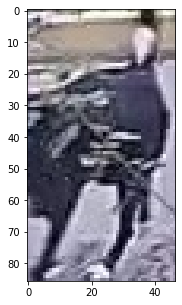

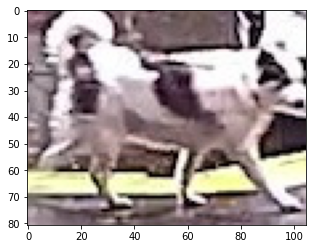

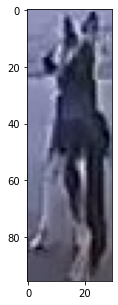

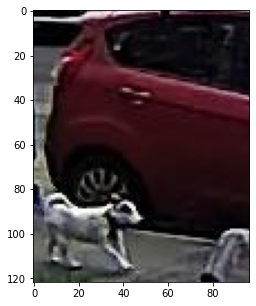

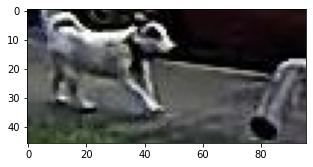

...

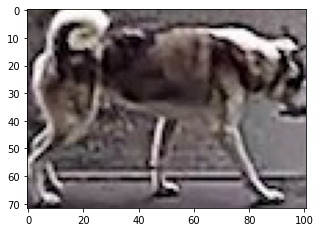

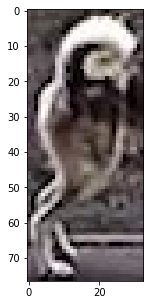

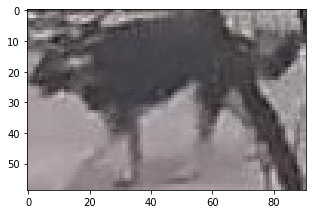

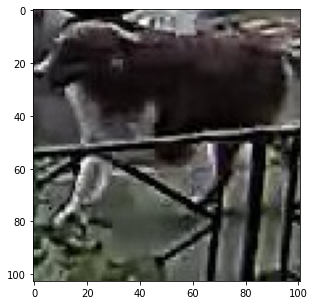

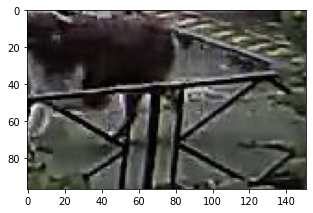

yorkshire_terrier


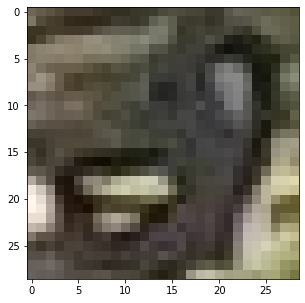

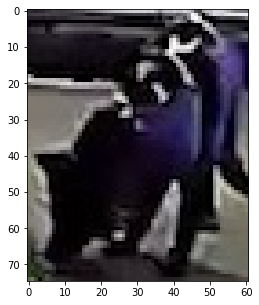

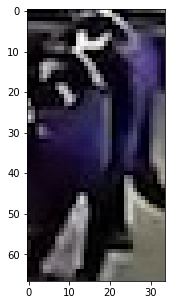

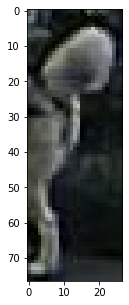

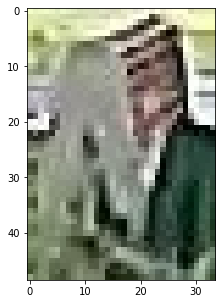

...

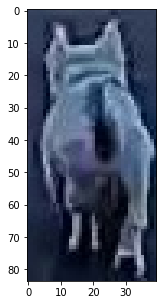

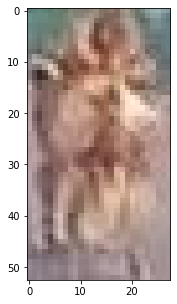

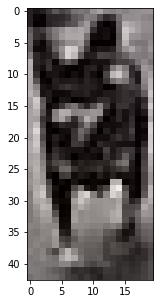

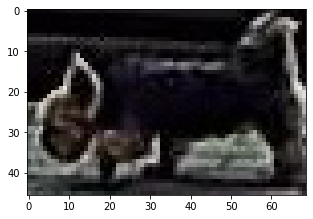

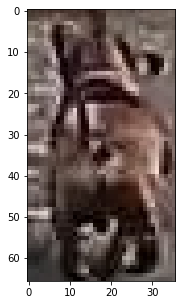

cardigan


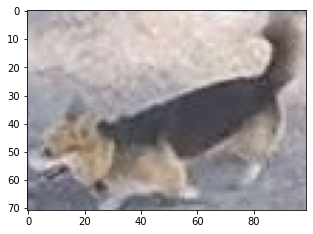

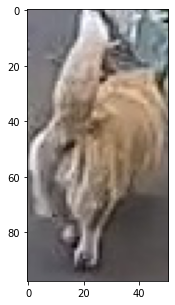

english_foxhound


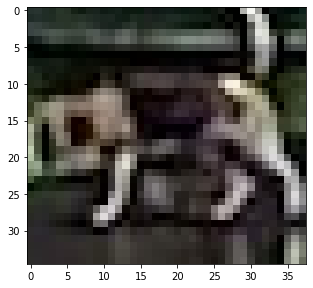

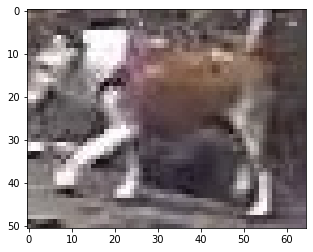

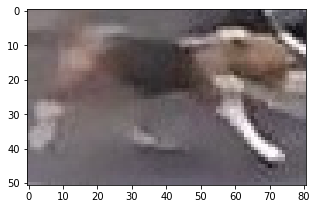

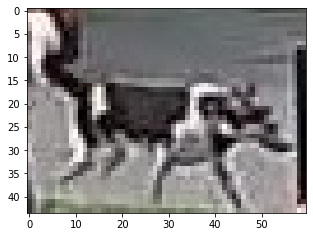

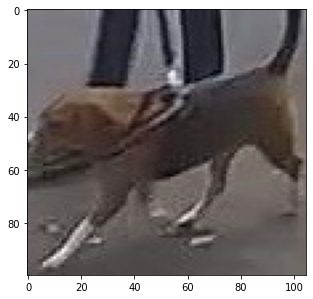

...

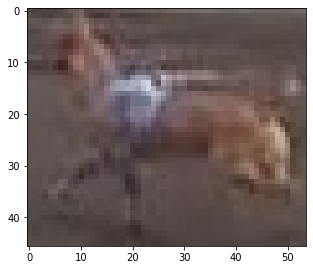

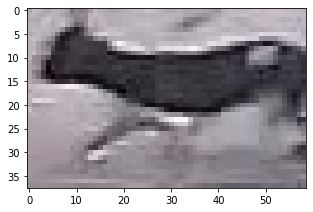

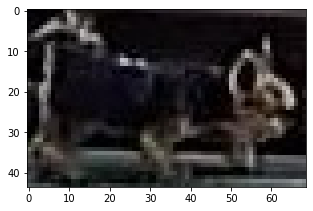

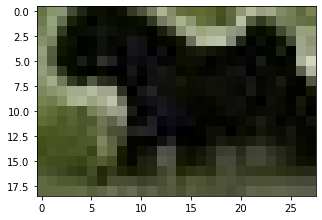

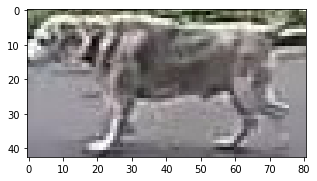

schipperke


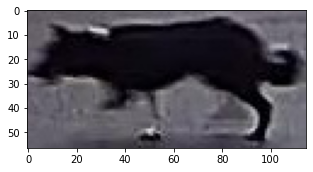

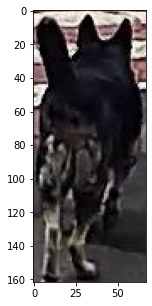

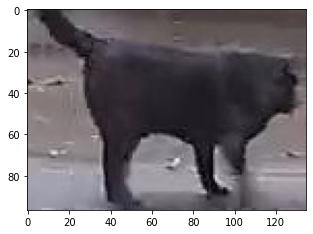

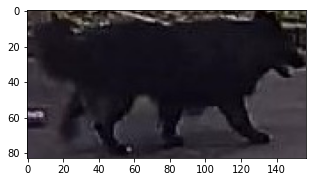

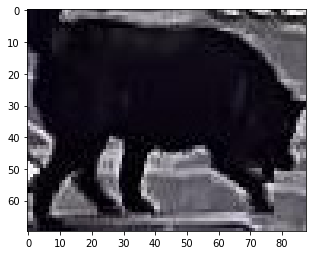

...

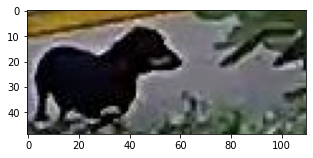

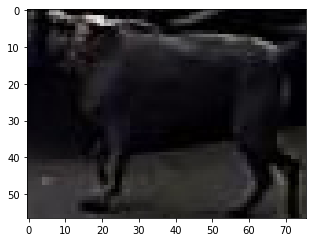

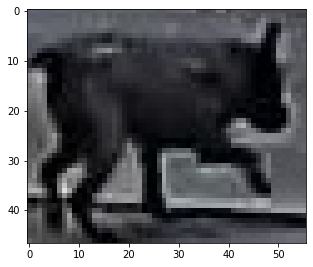

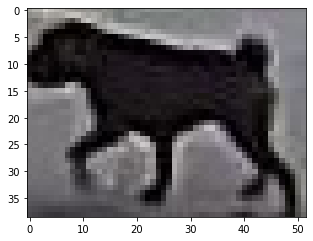

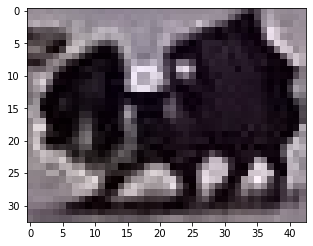

japanese_spaniel


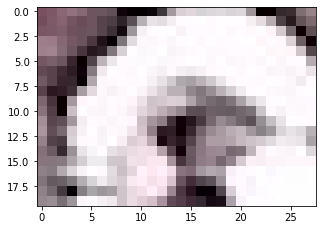

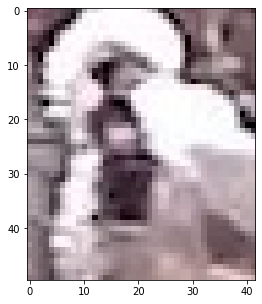

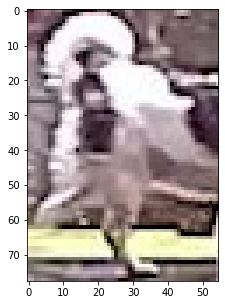

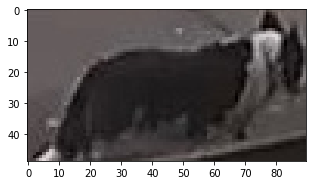

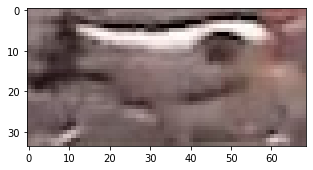

...

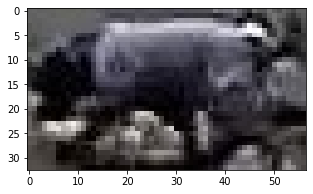

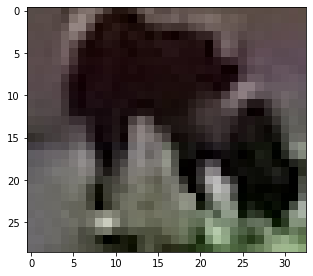

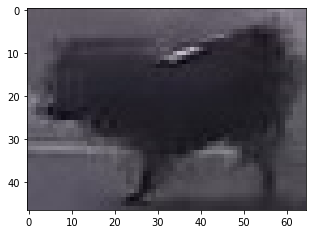

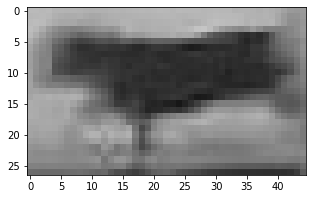

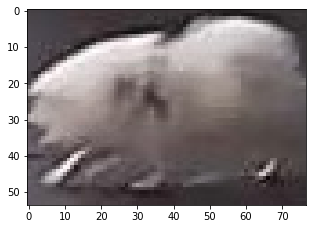

otterhound


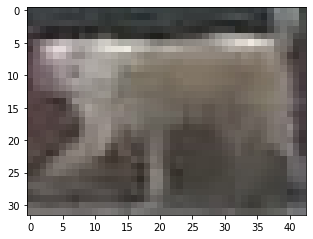

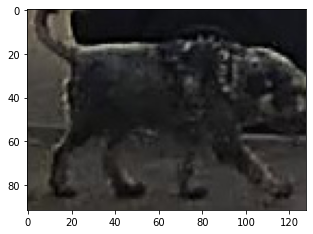

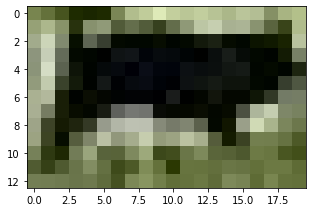

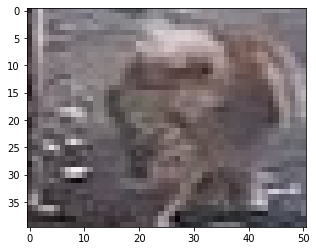

mexican_hairless


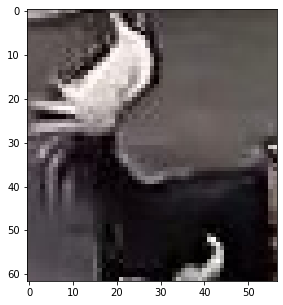

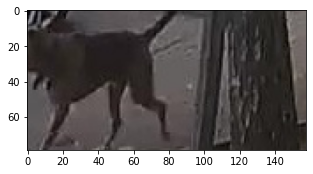

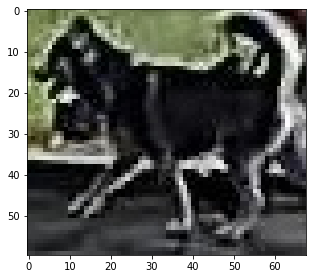

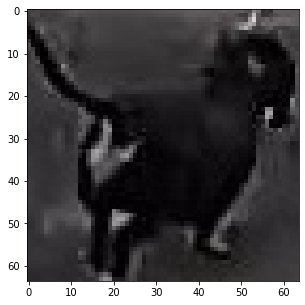

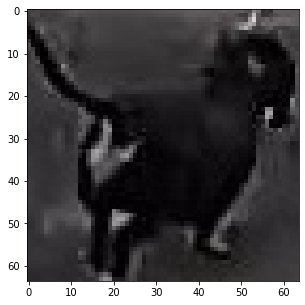

...

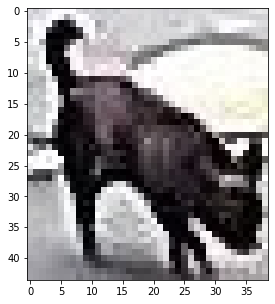

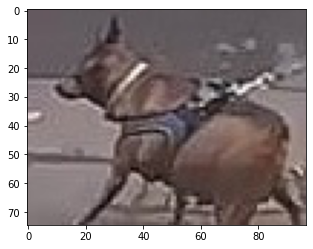

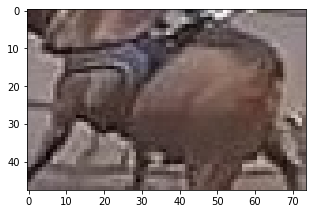

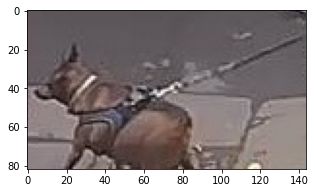

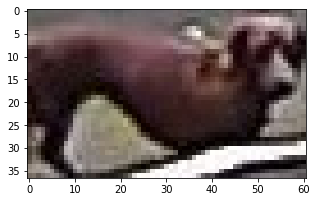

toy_terrier


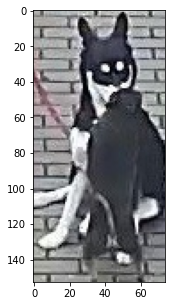

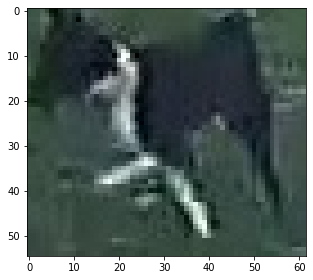

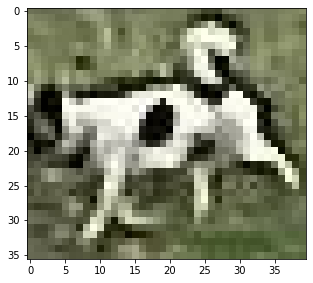

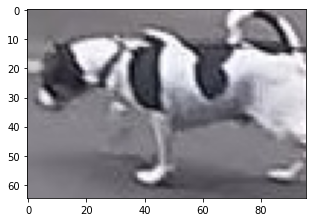

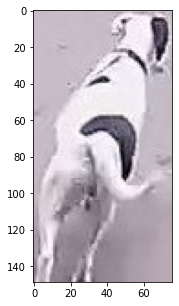

...

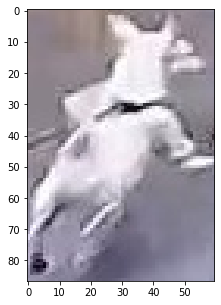

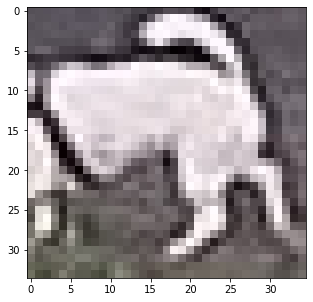

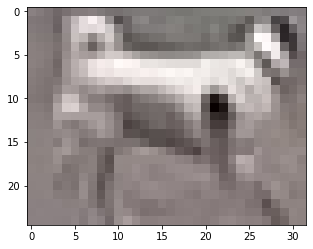

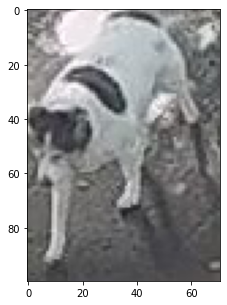

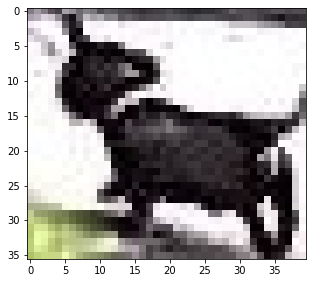

bluetick


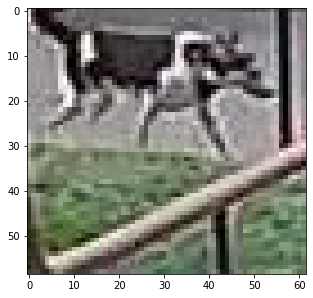

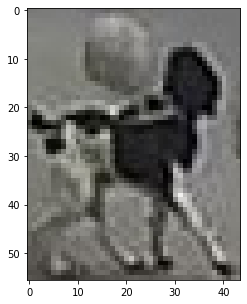

boston_bull


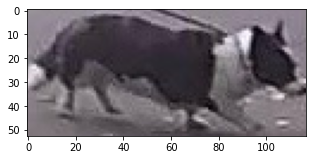

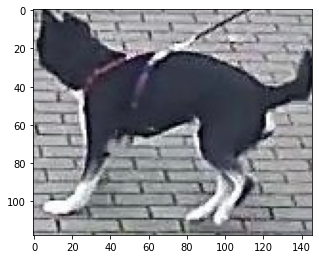

standard_schnauzer


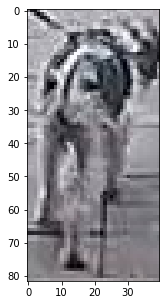

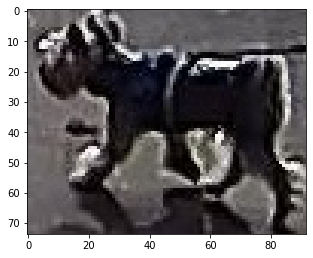

african_hunting_dog


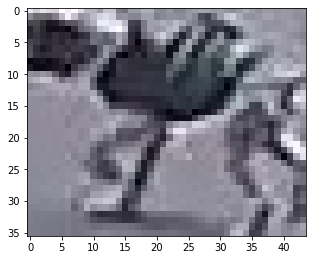

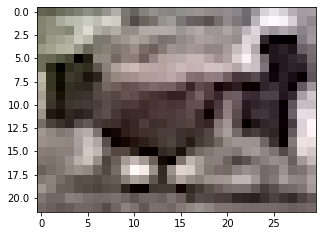

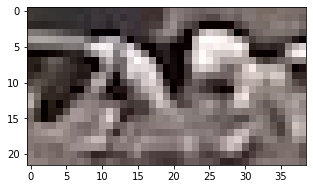

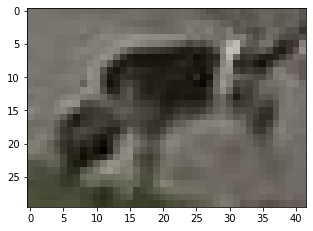

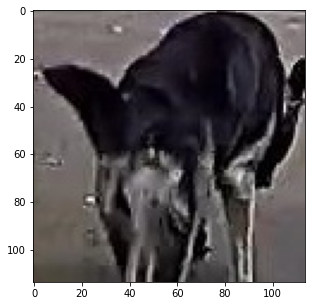

...

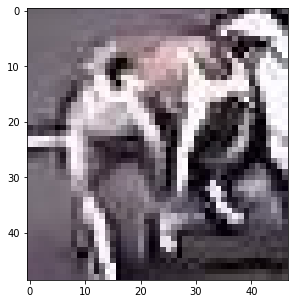

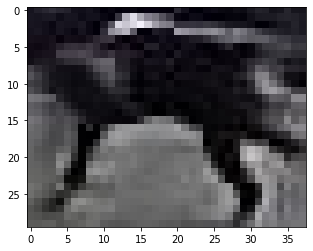

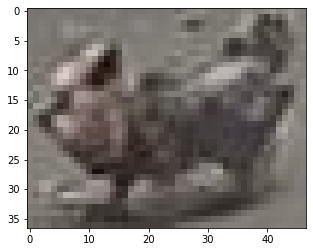

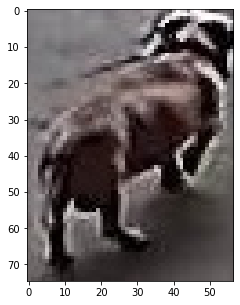

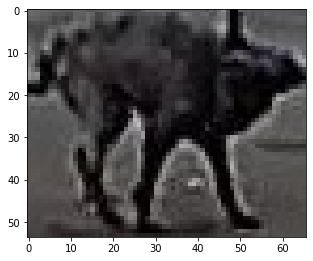

german_short-haired_pointer


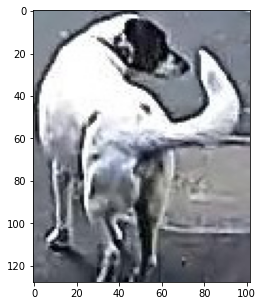

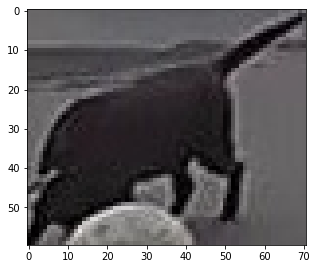

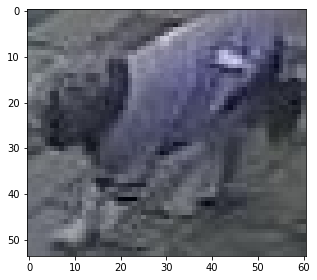

chesapeake_bay_retriever


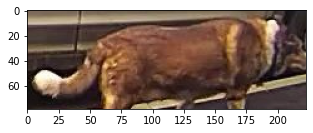

wire-haired_fox_terrier


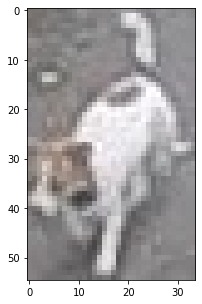

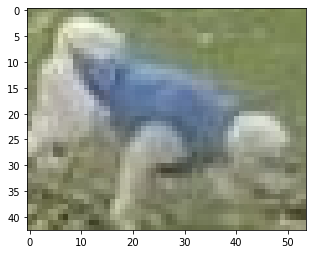

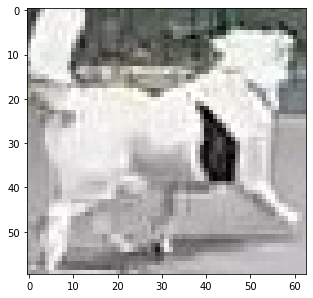

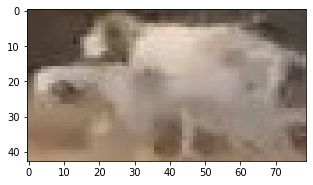

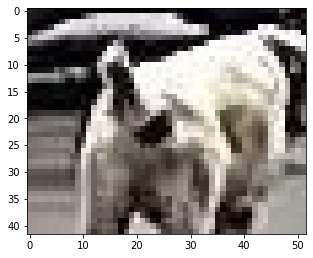

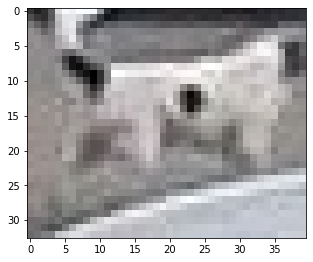

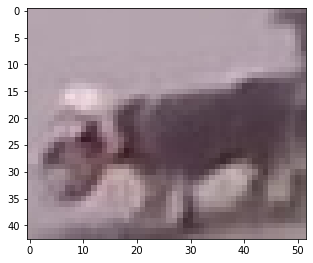

pug


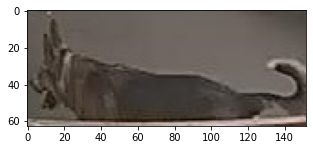

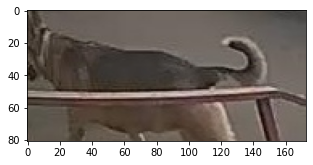

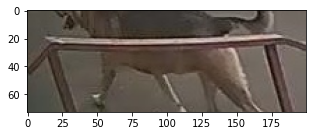

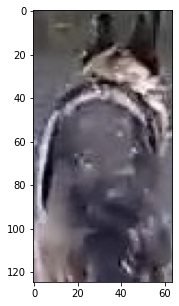

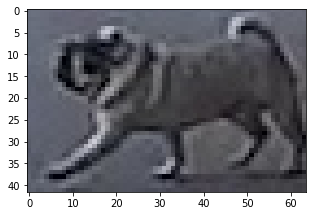

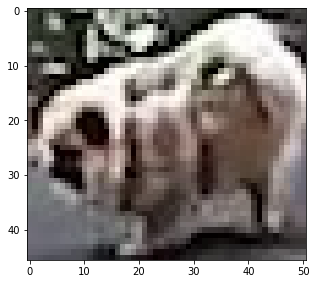

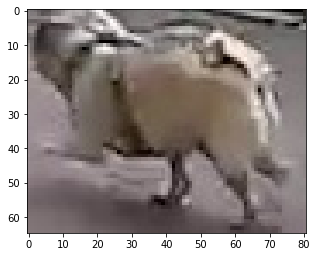

black-and-tan_coonhound


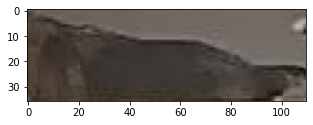

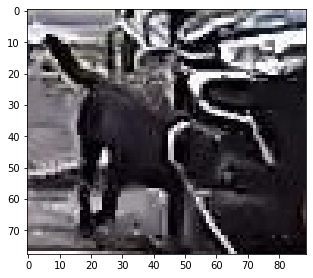

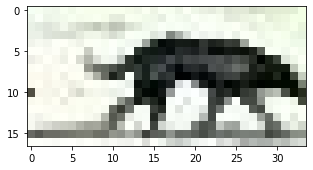

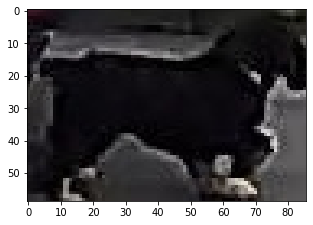

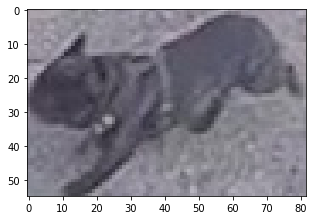

great_dane


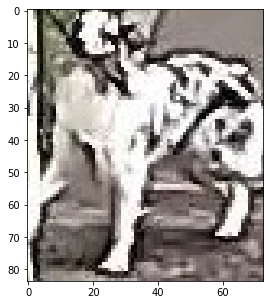

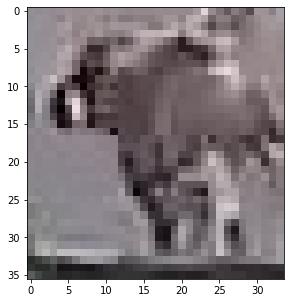

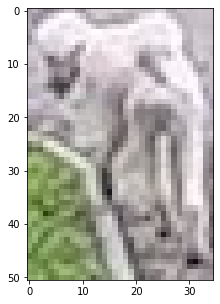

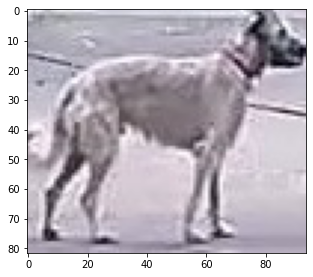

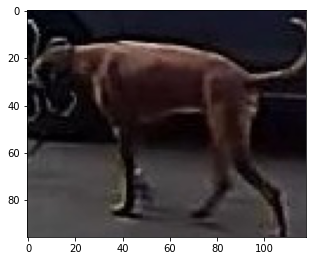

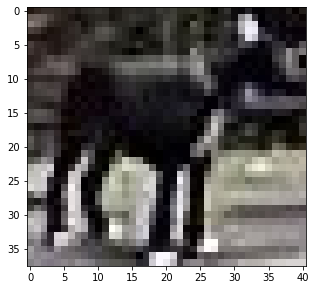

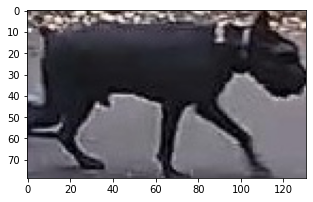

papillon


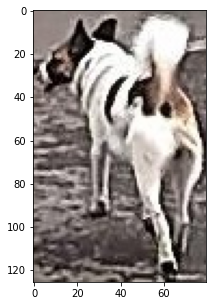

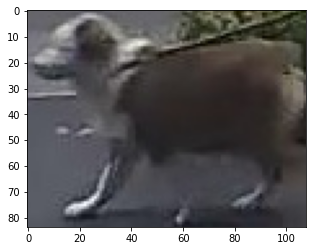

basenji


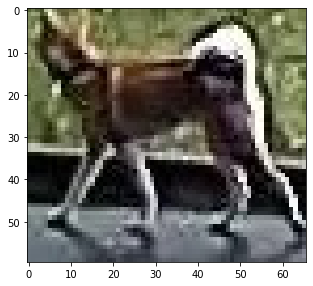

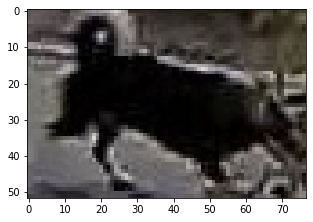

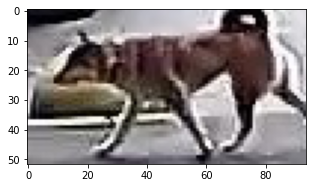

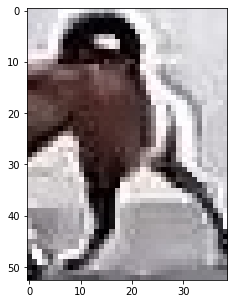

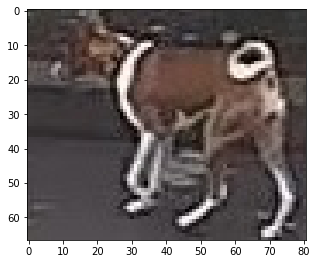

...

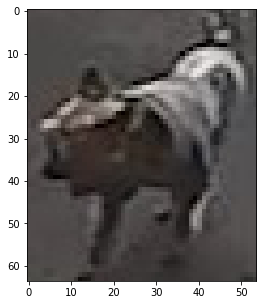

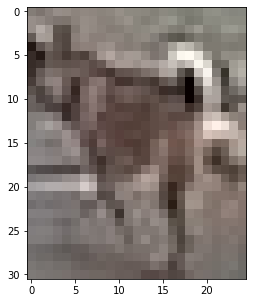

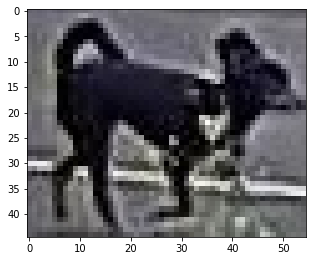

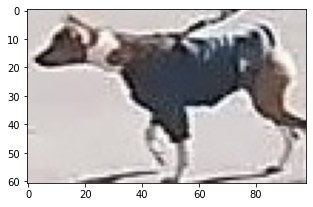

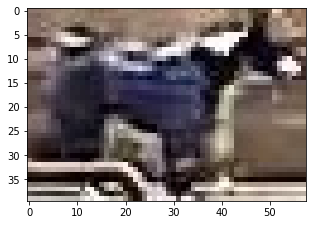

tibetan_mastiff


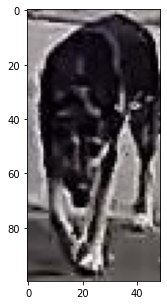

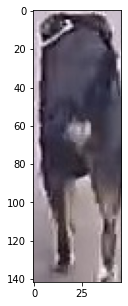

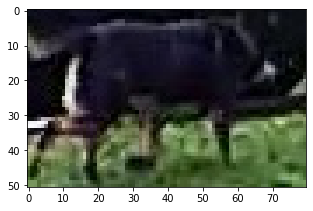

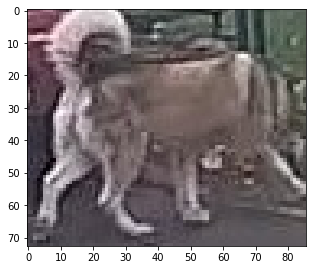

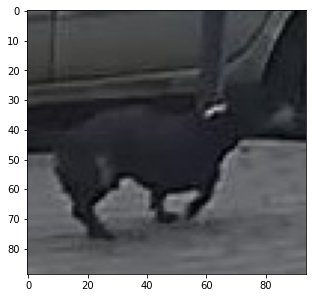

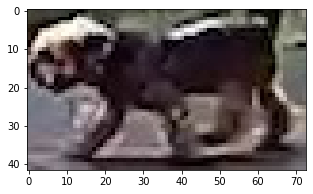

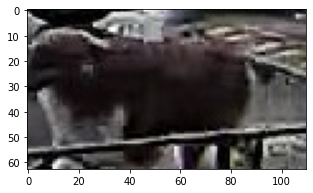

sussex_spaniel


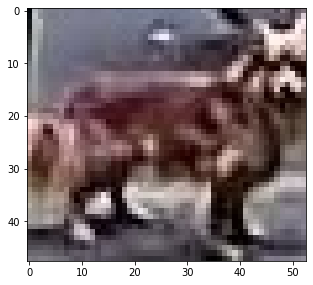

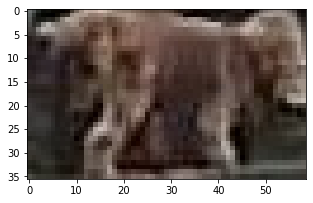

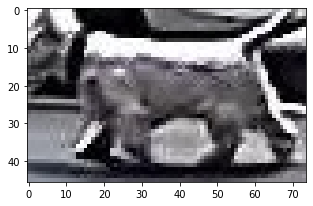

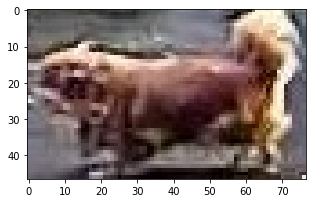

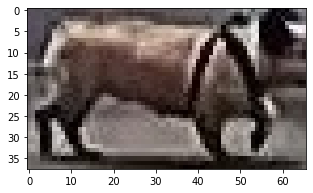

dhole


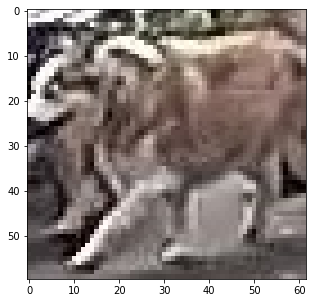

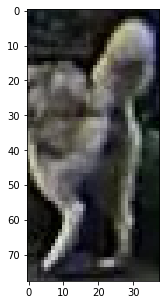

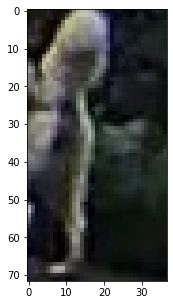

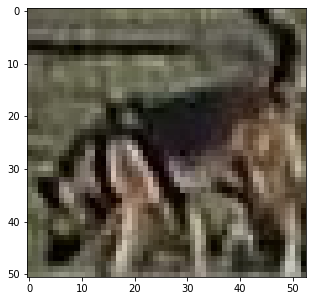

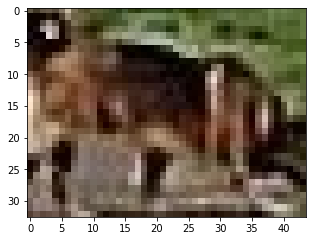

...

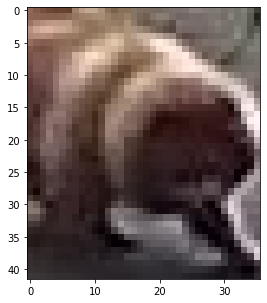

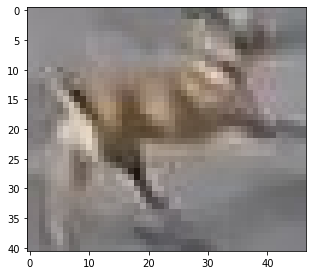

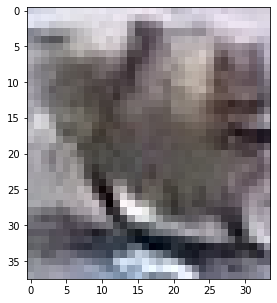

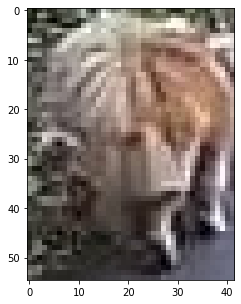

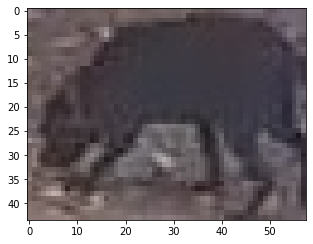

eskimo_dog


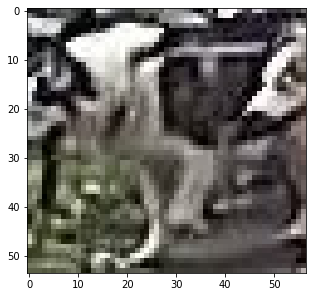

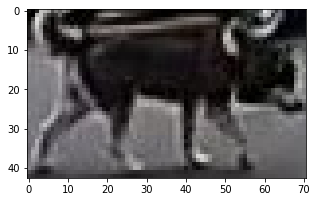

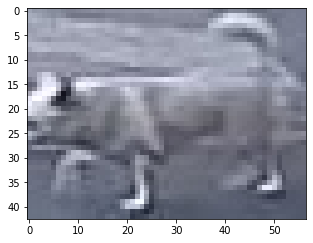

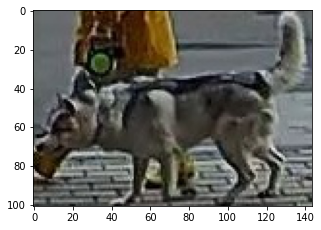

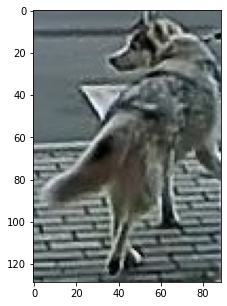

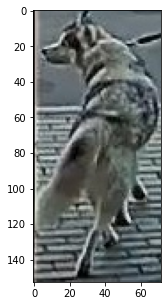

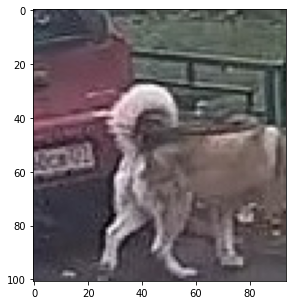

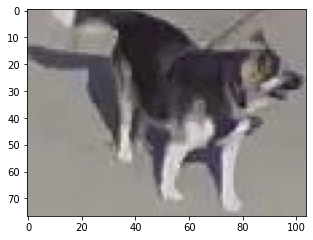

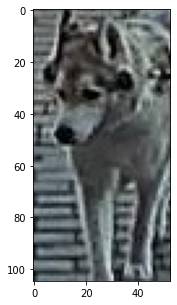

german_shepherd


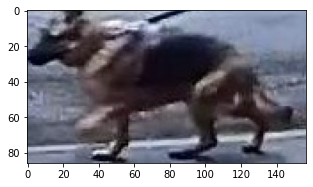

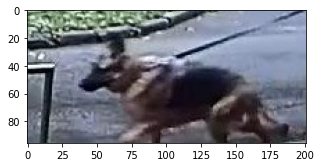

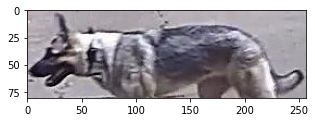

malamute


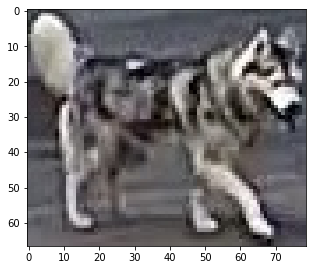

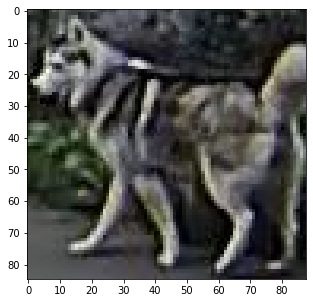

kelpie


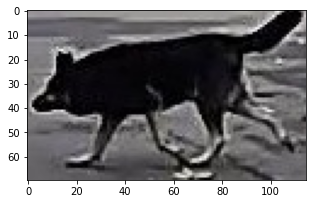

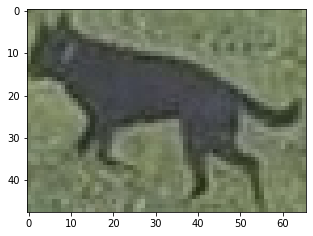

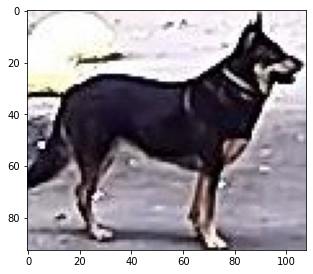

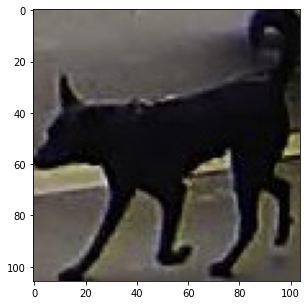

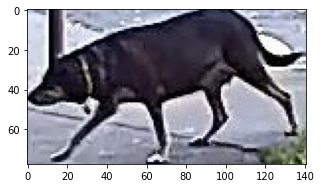

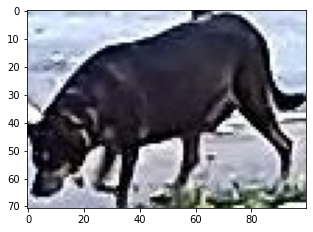

norwegian_elkhound


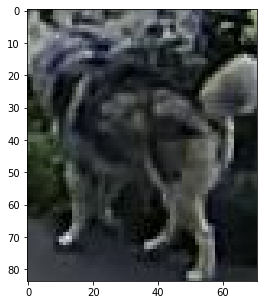

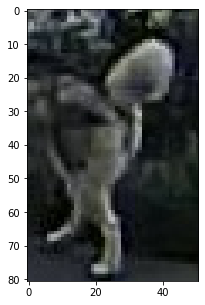

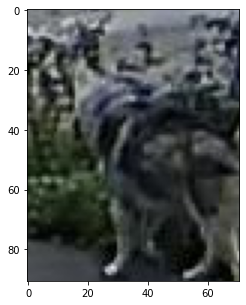

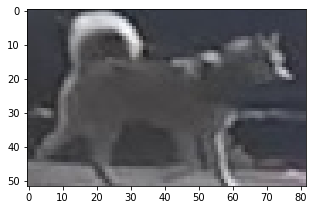

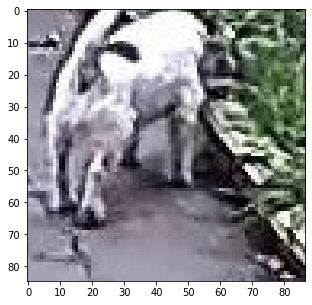

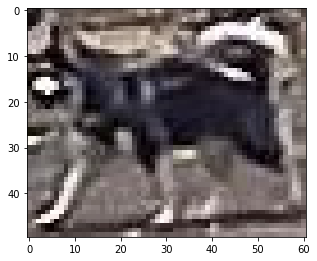

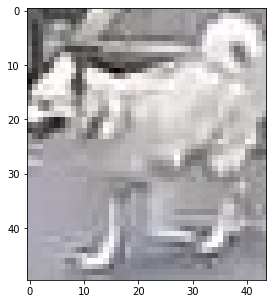

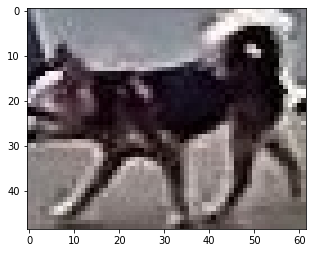

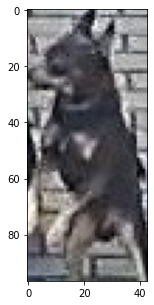

whippet


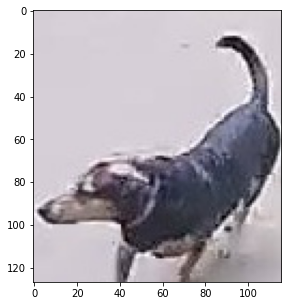

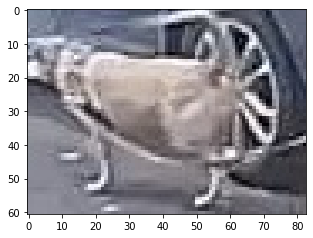

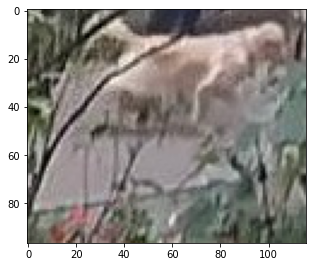

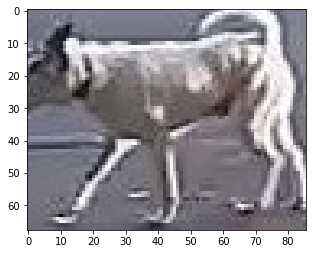

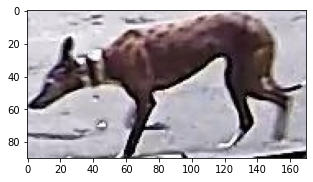

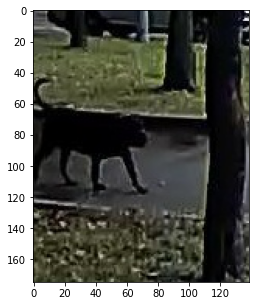

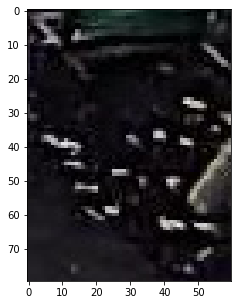

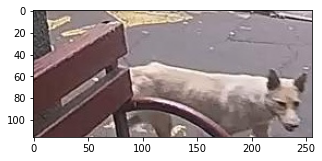

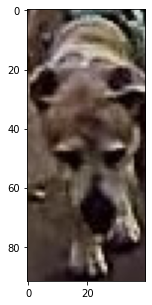

affenpinscher


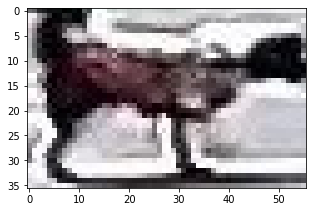

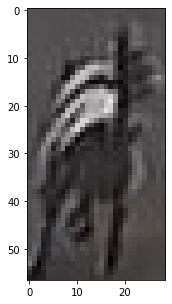

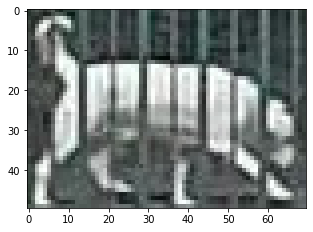

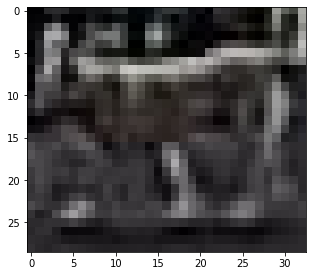

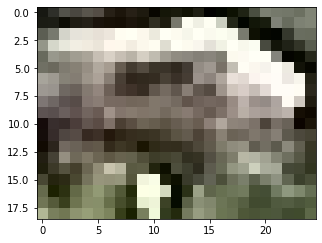

...

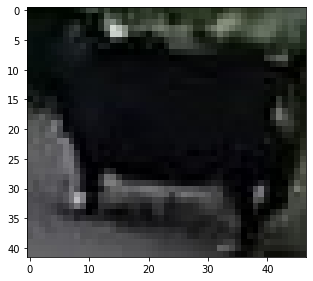

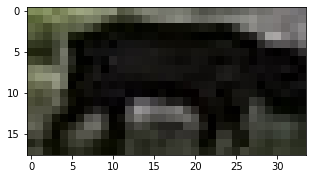

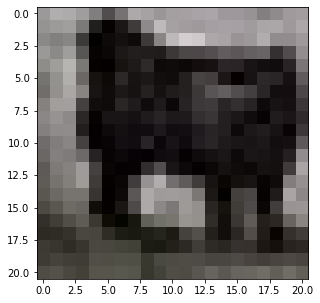

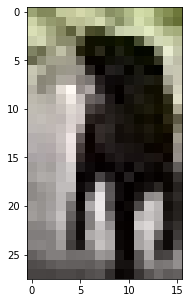

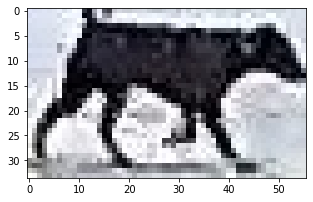

samoyed


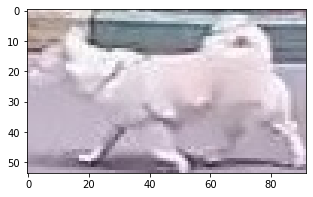

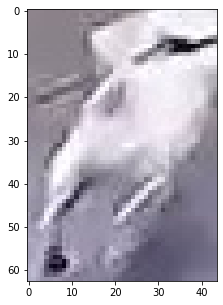

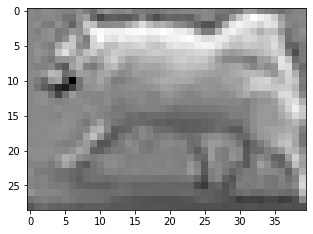

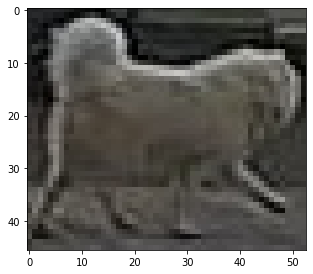

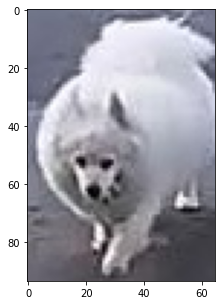

...

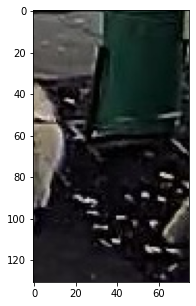

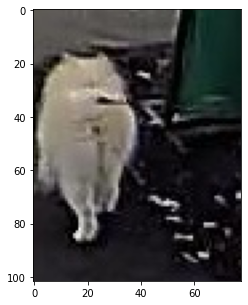

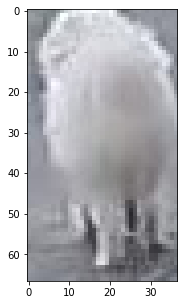

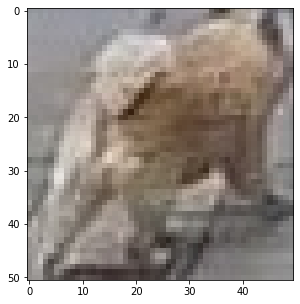

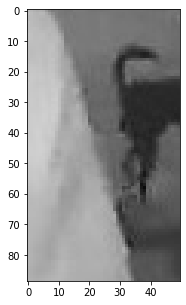

dingo


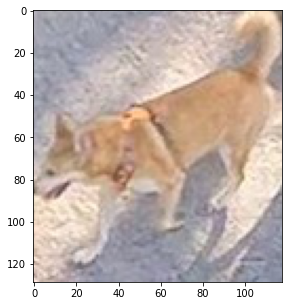

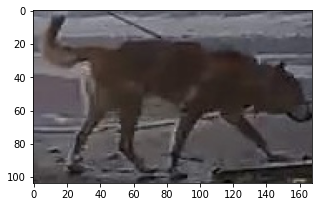

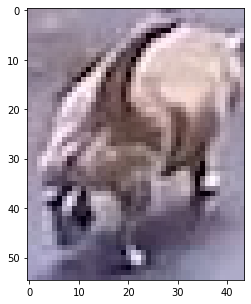

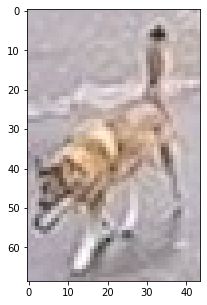

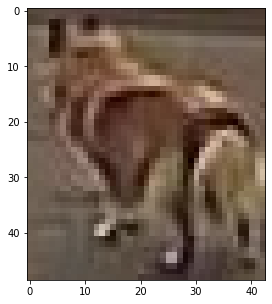

...

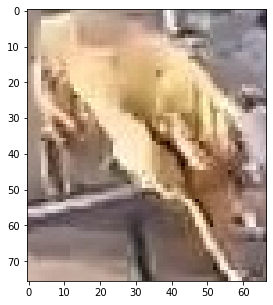

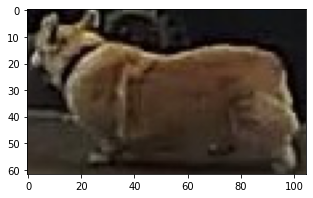

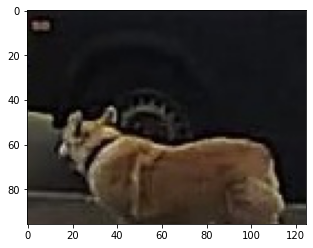

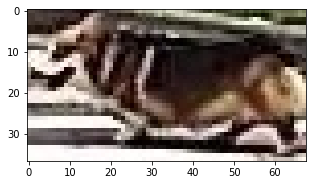

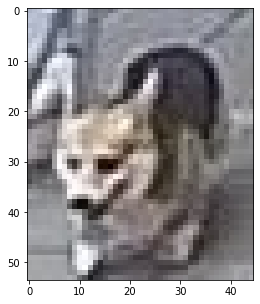

pomeranian


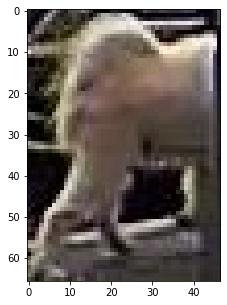

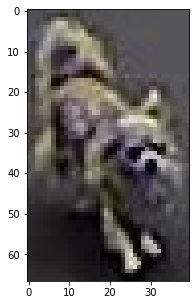

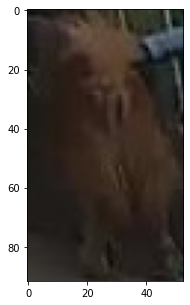

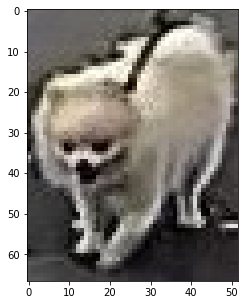

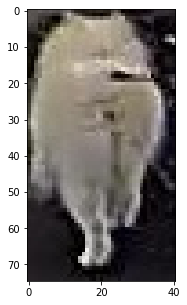

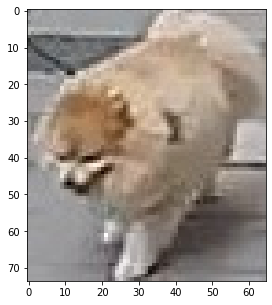

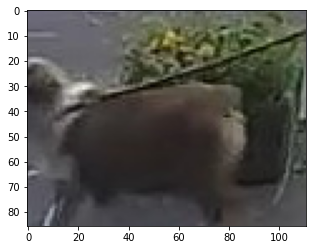

english_setter


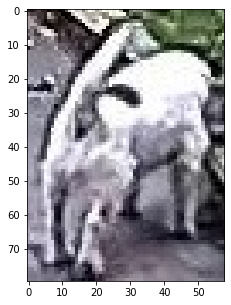

sealyham_terrier


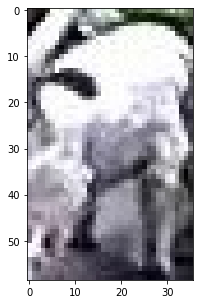

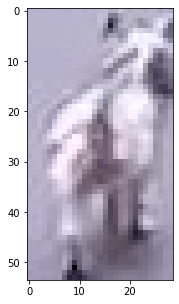

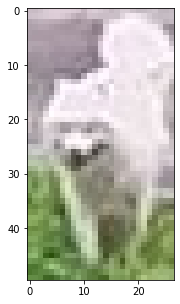

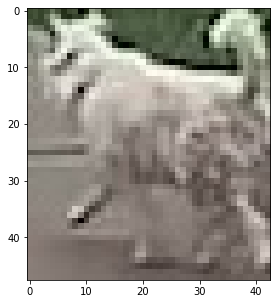

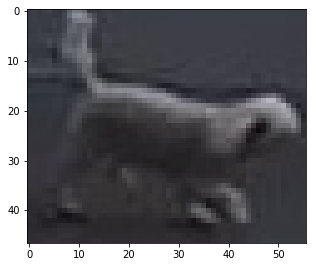

...

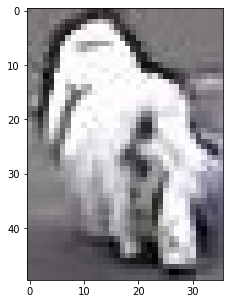

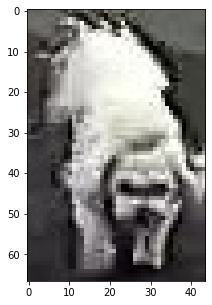

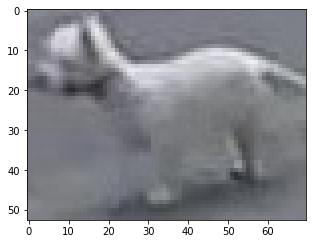

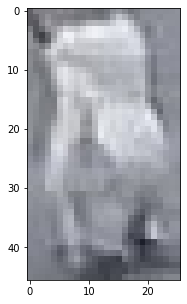

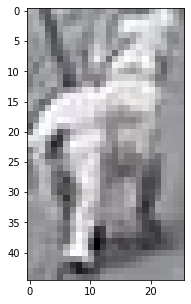

shetland_sheepdog


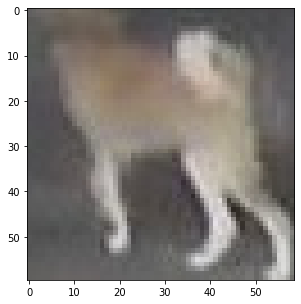

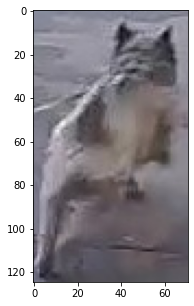

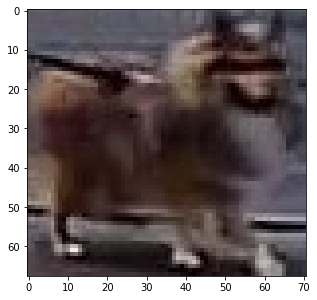

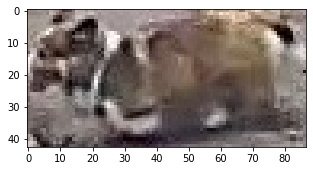

dandie_dinmont


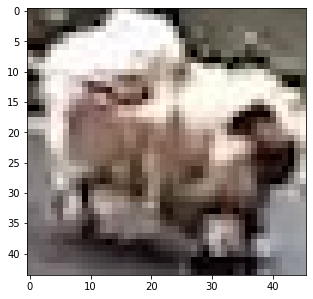

great_pyrenees


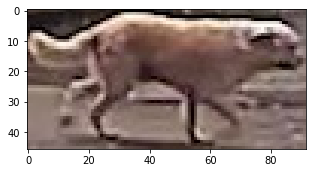

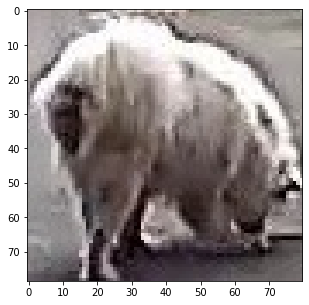

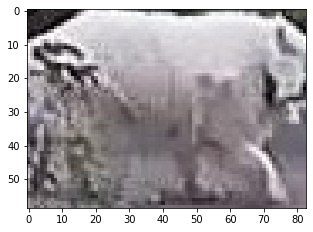

miniature_schnauzer


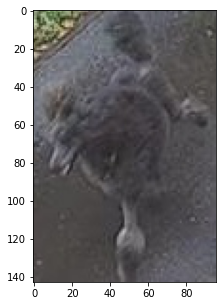

pekinese


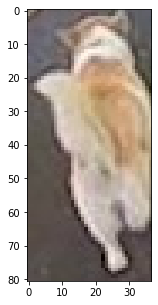

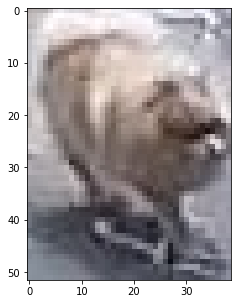

chow


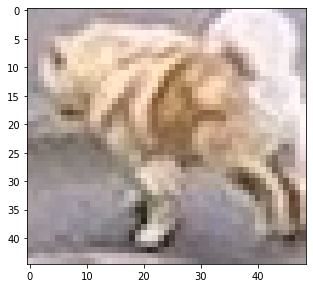

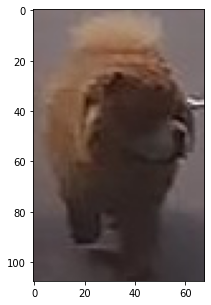

flat-coated_retriever


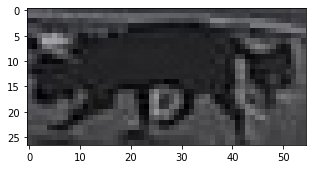

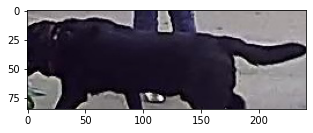

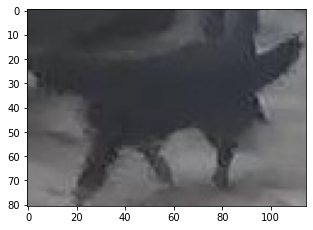

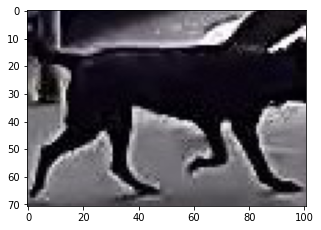

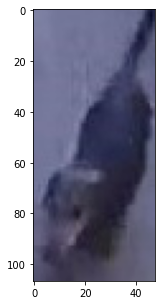

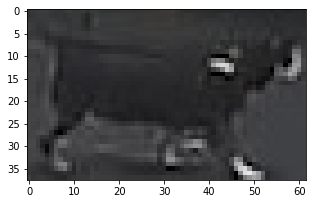

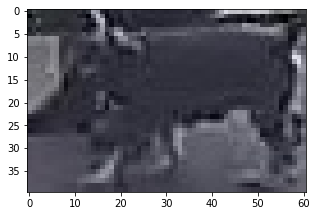

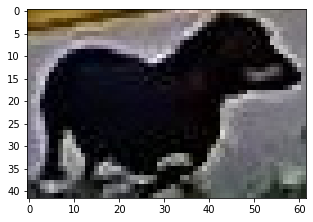

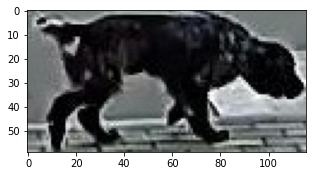

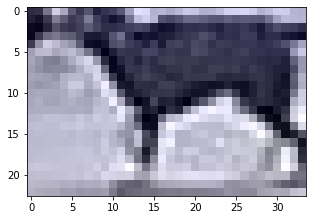

golden_retriever


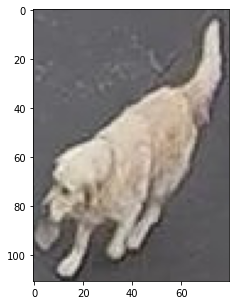

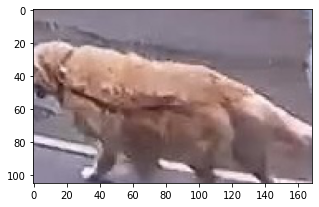

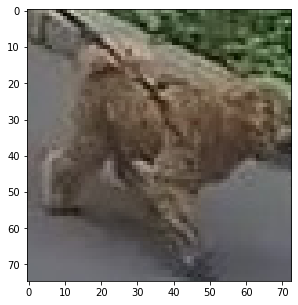

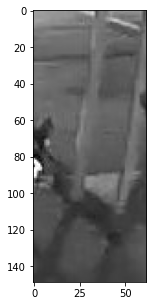

bloodhound


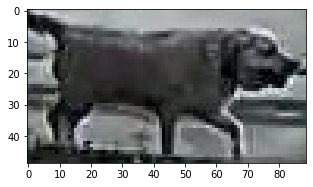

komondor


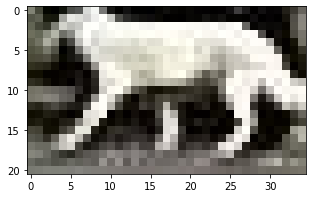

curly-coated_retriever


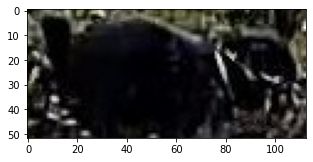

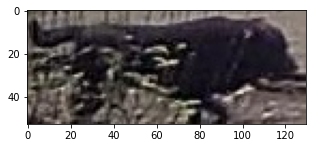

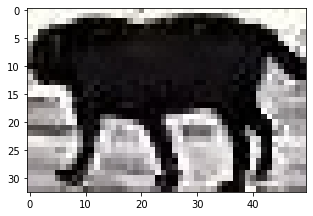

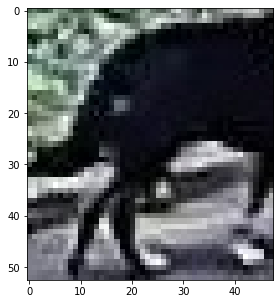

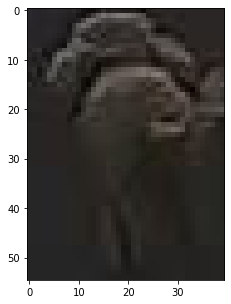

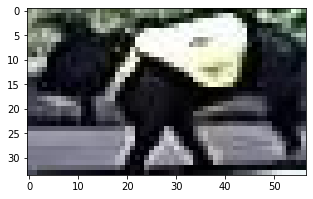

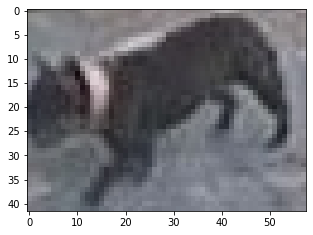

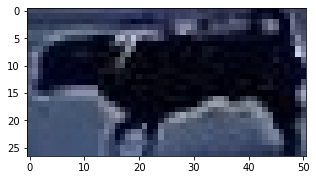

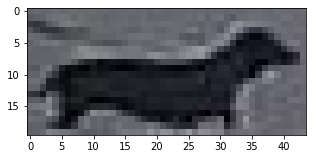

rhodesian_ridgeback


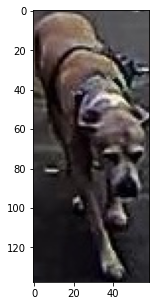

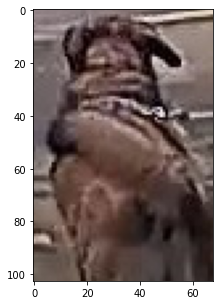

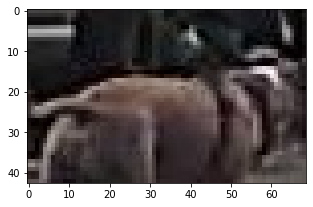

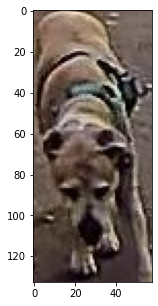

keeshond


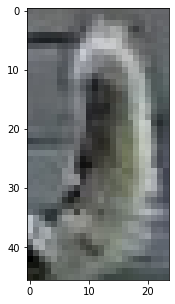

borzoi


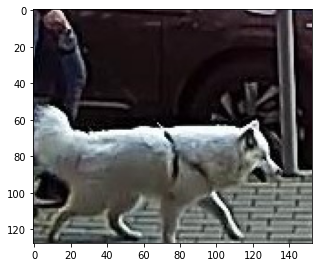

redbone


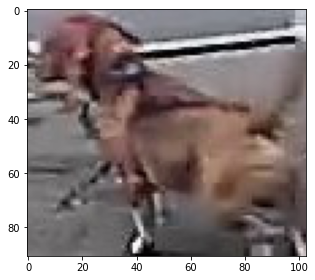

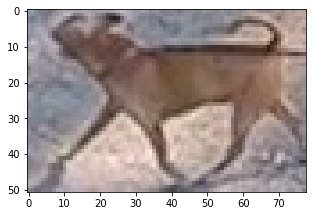

labrador_retriever


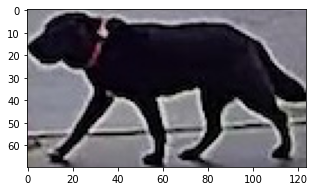

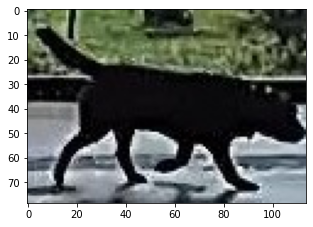

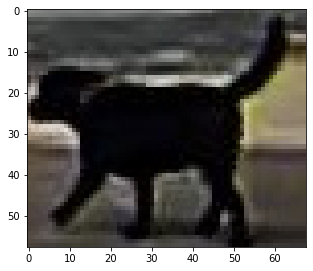

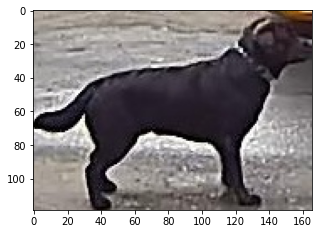

entlebucher


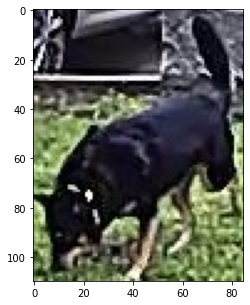

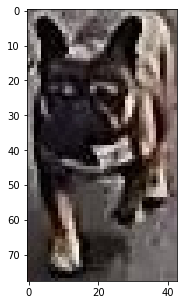

kerry_blue_terrier


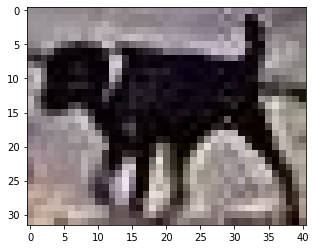

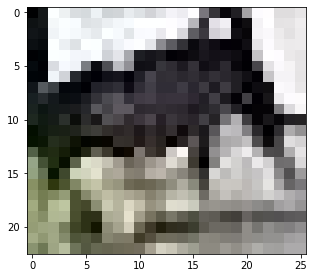

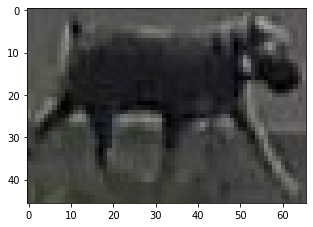

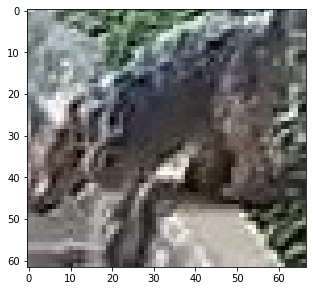

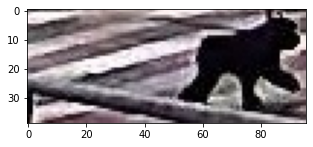

bedlington_terrier


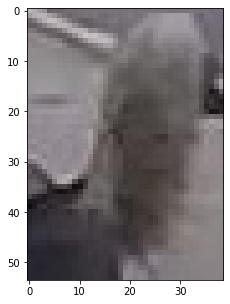

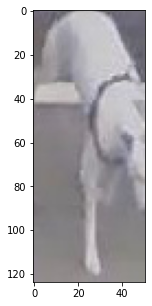

staffordshire_bullterrier


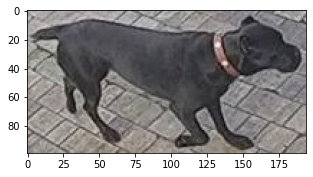

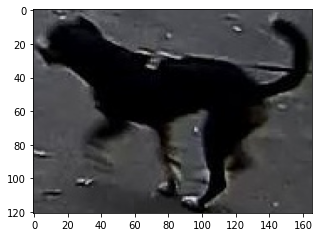

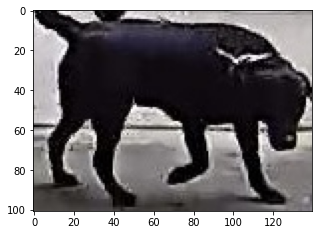

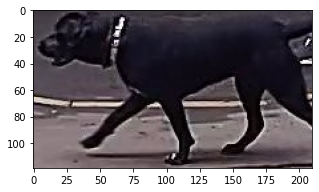

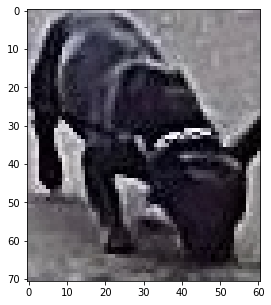

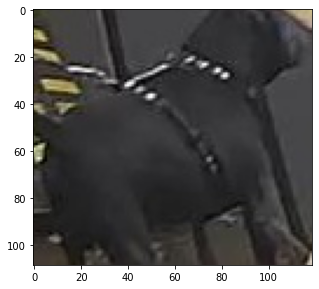

doberman


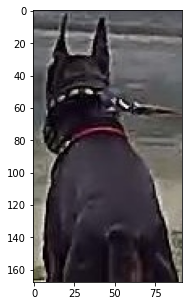

standard_poodle


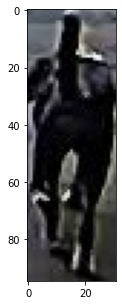

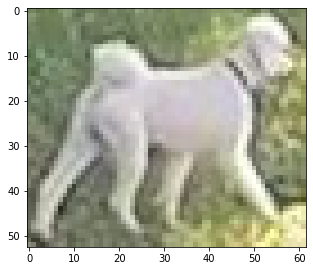

border_collie


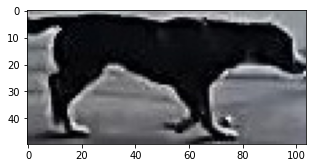

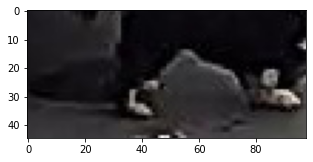

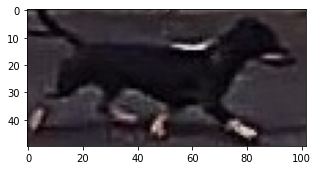

newfoundland


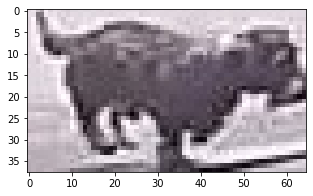

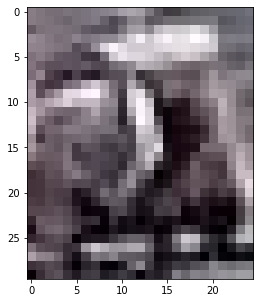

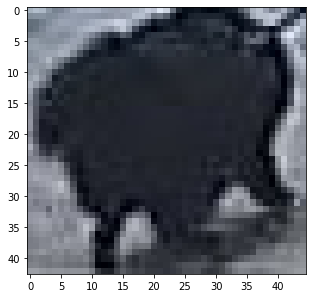

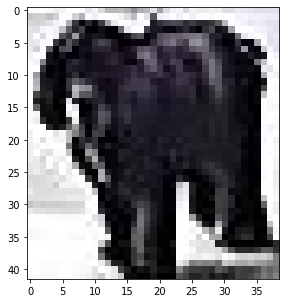

tibetan_terrier


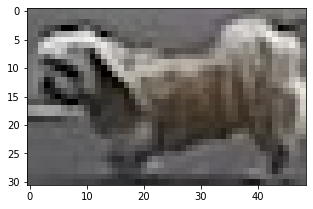

maltese_dog


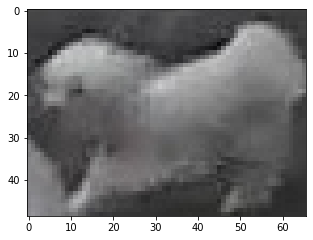

ibizan_hound


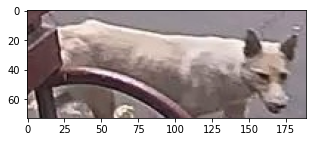

walker_hound


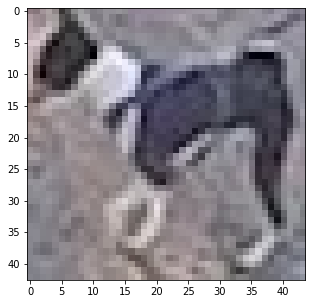

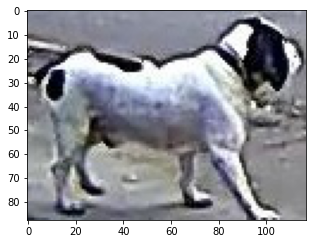

brittany_spaniel


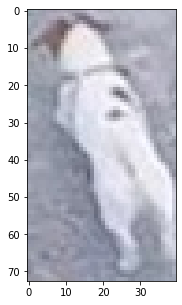

basset


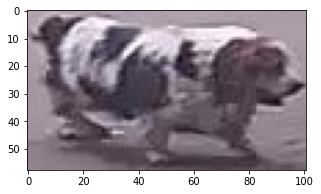

beagle


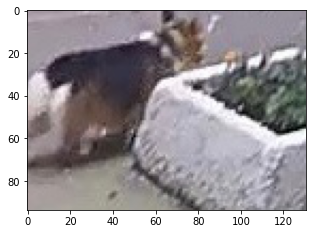

french_bulldog


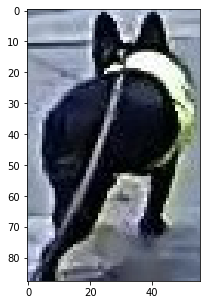

blenheim_spaniel


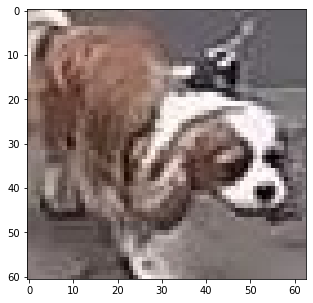

chihuahua


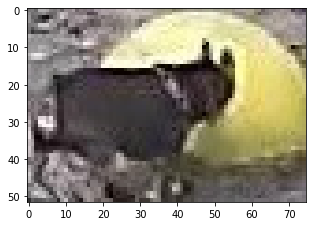

bouvier_des_flandres


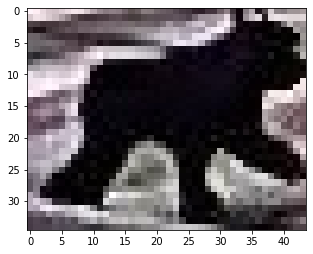

In [16]:
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure, imshow, axis
from matplotlib.image import imread

for breed in tmp['Predicted class name'].unique():
    print(breed)
    for i, row in tmp[tmp['Predicted class name'] == breed].iterrows():
        plt.figure(figsize=(5,5))
        image = imread(os.path.join(data_dir, row['path']))
        imshow(image)
        plt.show()         

In [34]:
empty_rows = []
for i in range(0, len(class_names), 1):
    if class_names[i] not in tmp['Predicted class name']:
        empty_rows.append([i,class_names[i], '', '', 'not found' ])
empty_rows = pd.DataFrame(empty_rows)
empty_rows.columns = ['Predicted class','Predicted class name','name','path','tail']

tmp_ = pd.concat([tmp, empty_rows])
tmp_ = tmp_.sort_values(by='Predicted class')
tmp_

,Predicted class,Predicted class name,path,tail,name
379,0,affenpinscher,long/85201.jpg,long,NaN
384,0,affenpinscher,long/85368.jpg,long,NaN
607,0,affenpinscher,short/94395.jpg,short,NaN
605,0,affenpinscher,short/94246.jpg,short,NaN
285,0,affenpinscher,long/78029.jpg,long,NaN
...,...,...,...,...,...
546,119,yorkshire_terrier,short/64768.jpg,short,NaN
553,119,yorkshire_terrier,short/65803.jpg,short,NaN
595,119,yorkshire_terrier,short/93786.jpg,short,NaN
1,119,yorkshire_terrier,long/49978.jpg,long,NaN


In [39]:
pd.crosstab(tmp_['Predicted class name'], tmp_['tail']).to_excel('breeds_predicted.xls')

## Save trained models

In [47]:
trained_models_ = []
for i in range(0, len(trained_models), 1):
    model_file_name = 'models/trained_model_' + str(i)
    trained_models[i].save(model_file_name)
    trained_models_.append(keras.models.load_model(model_file_name))    

INFO:tensorflow:Assets written to: models/trained_model_0\assets
INFO:tensorflow:Assets written to: models/trained_model_1\assets
INFO:tensorflow:Assets written to: models/trained_model_2\assets
